## Imports

In [1]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
import seaborn as sea
from tqdm.notebook import tqdm
plt.style.use('seaborn')
# import urllib.request
import requests
from io import BytesIO
import cv2
import torchvision
import torchvision.transforms as transforms
import time
os.environ['TORCH_MODEL_ZOO'] = '/scratch/fk/'

# kaggle datasets download -d dansbecker/cityscapes-image-pairs

In [2]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
device = torch.device(device)
print(device)

def get_num_parameters(model):
    counter = 0
    for param in model.parameters():
        counter += param.numel()
    print(f"Number of parameters: {counter:,}")
    
    
def get_image(url, img_size=(224, 224)):
    response = requests.get(url)
    image_data = response.content

    # Open the image using PIL (Python Imaging Library)
    img = np.array(Image.open(BytesIO(image_data)))
    if img_size is not None:
        img = cv2.resize(img, img_size)
    return img

imagenet = {}

with open('./imagenet_classes.txt', "r") as f:
    line = f.read()
    
for l in line.split('\n'):
    l = l.split(':')
    imagenet[int(l[0])] = l[1][1:-1]
    


cuda:0


## Q1: Segmentation 

### 1. Preparation

In [3]:
data_dir = '/scratch/fk/cityscapes_data'

train_dir = os.path.join(data_dir, "train") 
val_dir = os.path.join(data_dir, "val")

train_fns = os.listdir(train_dir)
val_fns = os.listdir(val_dir)
print(len(train_fns), len(val_fns))

2975 500


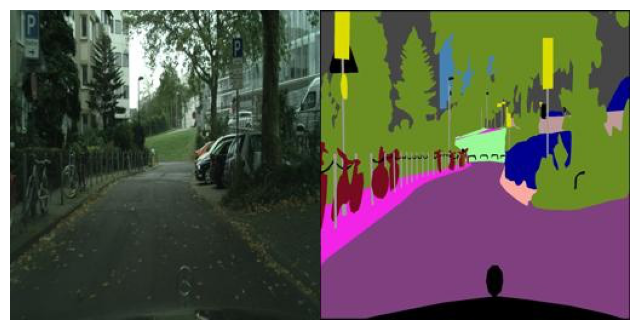

In [4]:
sample_image_fp = os.path.join(train_dir, train_fns[0])
sample_image = plt.imread(sample_image_fp)
plt.imshow(sample_image)
plt.axis('off')
plt.show()

In [5]:
def split_image(image):
  image = np.array(image)
  cityscape, label = image[:, :256, :], image[:, 256:, :]
  return cityscape, label

(-0.5, 255.5, 255.5, -0.5)

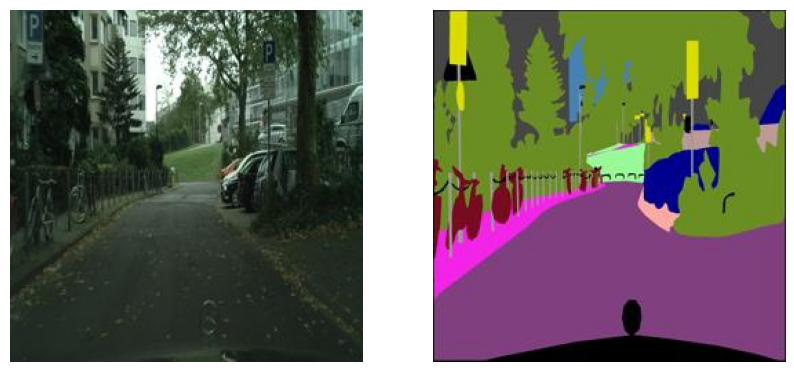

In [6]:
sample_image = np.array(sample_image)
cityscape, label = split_image(sample_image)

# display split images
cityscape, label = Image.fromarray(cityscape), Image.fromarray(label)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cityscape)
axes[0].axis('off')
axes[1].imshow(label)
axes[1].axis('off')

In [7]:
class KMeansTorch:
    def __init__(self, num_clusters, max_iters=200, device='cuda'):
        self.num_clusters = num_clusters
        self.max_iters = max_iters
        self.device = device
        self.centroids = None

    def forward(self, X):
        if isinstance(X, np.ndarray):
            X = torch.from_numpy(X).to(self.device)
        elif isinstance(X, list):
            X = torch.stack(X).to(self.device)
            
        N, D = X.shape
        self.centroids = X[torch.randperm(N)[:self.num_clusters]].to(self.device)
        
        for _ in tqdm(range(self.max_iters)):
            distances = torch.cdist(X, self.centroids)
            assignments = torch.argmin(distances, dim=1)
            for i in range(self.num_clusters):
                cluster_points = X[assignments == i]
                if len(cluster_points) > 0:
                    self.centroids[i] = cluster_points.mean(dim=0)

    def fit(self, X):
        self.forward(X)

    def predict(self, X, return_cpu=True): 
        if isinstance(X, np.ndarray):
            X = torch.from_numpy(X.astype(np.float32))
        X = X.to(device)
        distances = torch.cdist(X, self.centroids)
        assignments = torch.argmin(distances, dim=1)
        return assignments.cpu() if return_cpu else assignments

In [8]:
num_items = 1000
color_array = np.random.choice(range(256), 3*num_items).reshape(-1, 3).astype(np.float32)
print(color_array.shape)

(1000, 3)


In [9]:
kmeans = KMeansTorch(num_clusters=10)
kmeans.fit(color_array)
colors = kmeans.centroids
colors_np = colors.cpu().numpy()


  0%|          | 0/200 [00:00<?, ?it/s]

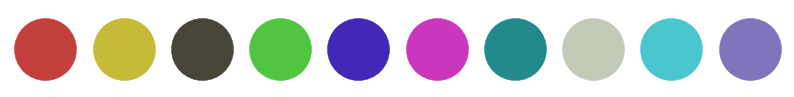

In [10]:
plt.figure(figsize=(10, 1))
for i, color in enumerate(colors_np):
    plt.scatter(i, 0, color=[c / 255 for c in color], s=2000)
    
plt.axis('off')
plt.show()

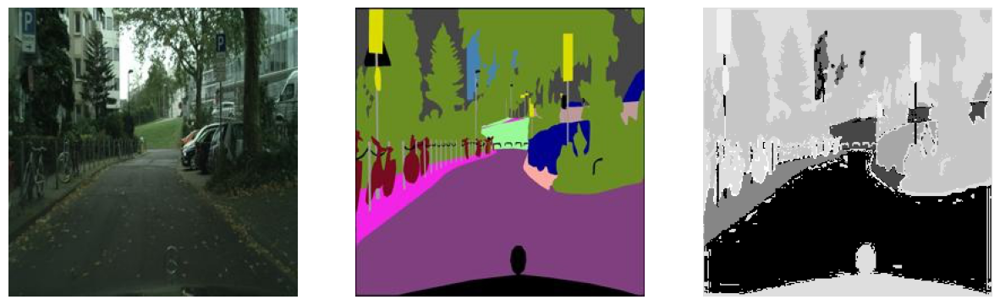

In [11]:
cityscape, label = split_image(sample_image)
label_class = kmeans.predict(label.reshape(-1,3)).numpy().reshape(256, 256)
fig, axes = plt.subplots(1, 3, figsize=(15,5))
axes[0].imshow(cityscape)
axes[0].axis('off')
axes[1].imshow(label)
axes[1].axis('off')
axes[2].imshow(label_class)
axes[2].axis('off')

plt.show()

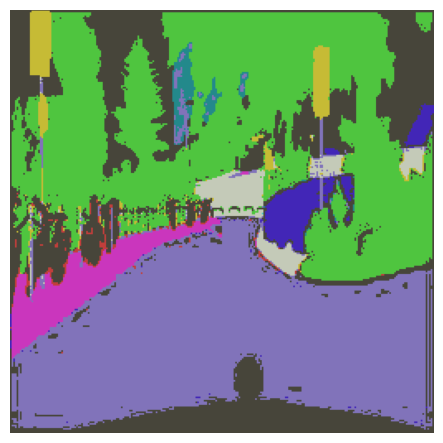

In [12]:

def convert_label_to_image(label_img, device=device):
    img = torch.zeros((256*256, 3), device=device)
    if isinstance(label_img, np.ndarray):
        label_img = torch.from_numpy(label_img).to(device)
        
    label_img = label_img.view(-1)

    for label in range(10):
        indices = torch.where(label_img == label)[0]
        img[indices] = colors[label].repeat(len(indices), 1)
        
    img = img.view((256, 256, 3))/255.0
    return img.cpu()

img = convert_label_to_image(label_class).numpy()
plt.imshow(img)
plt.axis('off')
plt.show()



In [13]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

class CityscapeDataset(Dataset):
    
    def __init__(self, image_dir, centroids, transforms=None):
        self.image_dir = image_dir
        self.image_fns = os.listdir(image_dir)
        self.centroids = centroids
        self.transforms = transforms
        
    def kmeans_predict(self, X):
        distances = torch.cdist(X, self.centroids)
        assignments = torch.argmin(distances, dim=1)
        return assignments

    def __len__(self):
        return len(self.image_fns)
    
    def __getitem__(self, index):
        image_fn = self.image_fns[index]
        image_fp = os.path.join(self.image_dir, image_fn)
        image = plt.imread(image_fp).astype(np.float32)
        cityscape, label = self.split_image(image)
        
        label = torch.from_numpy(label.reshape(-1, 3))
        label_class = self.kmeans_predict(label).view(256, 256)
        
        if self.transforms is not None:
            cityscape = self.transforms(cityscape)/255.0
        
        return cityscape, label_class

    def split_image(self, image):
        image = np.array(image)
        cityscape, label = image[:, :256, :], image[:, 256:, :]
        return cityscape, label
    

In [14]:

batch_size = 8

train_dataset = CityscapeDataset(train_dir, centroids=colors.cpu(), transforms=transform)
train_loader = DataLoader(train_dataset, batch_size = batch_size, num_workers=5)

val_dataset = CityscapeDataset(val_dir, centroids=colors.cpu(), transforms=transform)
val_loader = DataLoader(val_dataset, batch_size=batch_size)


a, b = next(iter(train_loader))
a.shape, b.shape

(torch.Size([8, 3, 256, 256]), torch.Size([8, 256, 256]))

In [15]:
a = torch.permute(a, (0, 2, 3, 1)).numpy()
a.shape

(8, 256, 256, 3)

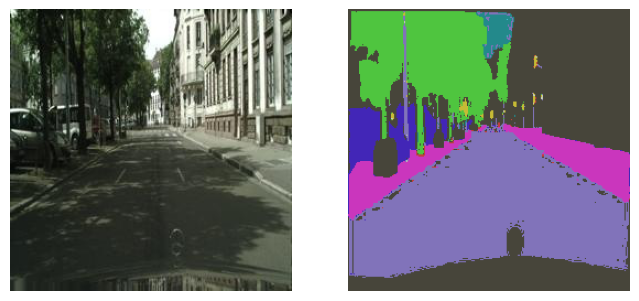

In [16]:
plt.subplot(1, 2, 1)
plt.imshow(a[5])
plt.axis('off')

label2img = convert_label_to_image(b[5])
plt.subplot(1,2,2)
plt.imshow(label2img)
plt.axis('off')

plt.show()

### 2. Importance of skip connections

In [6]:
class UNet(nn.Module):
    
    def __init__(self, num_classes, skips=True):
        super(UNet, self).__init__()
        self.num_classes = num_classes
        self.skips = skips
        self.contracting_11 = self.conv_block(in_channels=3, out_channels=64)
        self.contracting_12 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_21 = self.conv_block(in_channels=64, out_channels=128)
        self.contracting_22 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_31 = self.conv_block(in_channels=128, out_channels=256)
        self.contracting_32 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_41 = self.conv_block(in_channels=256, out_channels=512)
        self.contracting_42 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.middle = self.conv_block(in_channels=512, out_channels=1024)
        self.out_channels = 1024
        
        self.expansive_11 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_12 = self.conv_block(in_channels=1024 if self.skips else 512, out_channels=512)
        self.expansive_21 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_22 = self.conv_block(in_channels=512 if self.skips else 256, out_channels=256)
        self.expansive_31 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_32 = self.conv_block(in_channels=256 if self.skips else 128, out_channels=128)
        self.expansive_41 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_42 = self.conv_block(in_channels=128 if self.skips else 64, out_channels=64)
        self.output = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=3, stride=1, padding=1)
        
    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=out_channels),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def forward(self, X):
        
        # encoder
        contracting_11_out = self.contracting_11(X) # [-1, 64, 256, 256]
        contracting_12_out = self.contracting_12(contracting_11_out) # [-1, 64, 128, 128]
        contracting_21_out = self.contracting_21(contracting_12_out) # [-1, 128, 128, 128]
        contracting_22_out = self.contracting_22(contracting_21_out) # [-1, 128, 64, 64]
        contracting_31_out = self.contracting_31(contracting_22_out) # [-1, 256, 64, 64]
        contracting_32_out = self.contracting_32(contracting_31_out) # [-1, 256, 32, 32]
        contracting_41_out = self.contracting_41(contracting_32_out) # [-1, 512, 32, 32]
        contracting_42_out = self.contracting_42(contracting_41_out) # [-1, 512, 16, 16]
        
        # bottleneck
        middle_out = self.middle(contracting_42_out) # [-1, 1024, 16, 16]
        
        # decoder
        expansive_11_out = self.expansive_11(middle_out) # [-1, 512, 32, 32]

        expansive_12_out = self.expansive_12(
            torch.cat((expansive_11_out, contracting_41_out), dim=1) if self.skips else expansive_11_out) # [-1, 1024, 32, 32] -> [-1, 512, 32, 32]
        expansive_21_out = self.expansive_21(expansive_12_out) # [-1, 256, 64, 64]
        
        expansive_22_out = self.expansive_22(
            torch.cat((expansive_21_out, contracting_31_out), dim=1) if self.skips else expansive_21_out) # [-1, 512, 64, 64] -> [-1, 256, 64, 64]
        expansive_31_out = self.expansive_31(expansive_22_out) # [-1, 128, 128, 128]
        
        expansive_32_out = self.expansive_32(
            torch.cat((expansive_31_out, contracting_21_out), dim=1) if self.skips else expansive_31_out) # [-1, 256, 128, 128] -> [-1, 128, 128, 128]
        expansive_41_out = self.expansive_41(expansive_32_out) # [-1, 64, 256, 256]
        
        expansive_42_out = self.expansive_42(
            torch.cat((expansive_41_out, contracting_11_out), dim=1) if self.skips else expansive_41_out) # [-1, 128, 256, 256] -> [-1, 64, 256, 256]
        output_out = self.output(expansive_42_out) # [-1, num_classes, 256, 256]
        return output_out
    


In [18]:
class Trainer:
    def __init__(self, 
                 model,
                 train_loader, 
                 val_loader,
                 colors,
                 device):
        
        self.device = device
        self.model = model.to(self.device)
        self.train_loader = train_loader
        self.val_loader = val_loader
        
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        self.loss_fxn = nn.CrossEntropyLoss()
        self.color = colors.cpu()
        
    def calc_iou(self, y1, y2):
        iou, unique_labels = 0, torch.unique(y1)
        for label in unique_labels:
            a = y1 == label
            b = y2 == label
            intersection = torch.logical_and(a, b)
            union = torch.logical_or(a, b)
            iou += (torch.sum(intersection) / torch.sum(union)) * torch.mean(a.to(torch.float32))
            
        return iou
        
    def training_step(self, x, y):
        y_pred = self.model(x)
        loss = self.loss_fxn(y_pred, y)
        iou = self.calc_iou(y, torch.argmax(y_pred.detach(), dim=1))
        
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        return loss, iou
    
    def val_step(self, x, y):
        with torch.no_grad():
            y_pred = self.model(x)
            loss = self.loss_fxn(y_pred, y)
            iou = self.calc_iou(y, torch.argmax(y_pred.detach(), dim=1))
            
        return loss, iou
    
    def go_one_epoch(self, loader, step_fxn):
        loss, iou = 0, 0
        
        for x, y in tqdm(loader):
            x, y = x.to(self.device), y.to(self.device)
            loss_epoch, iou_epoch = step_fxn(x, y)
            loss += loss_epoch
            iou += iou_epoch
            
        return loss/len(loader), iou/len(loader)    
    
    def convert_mask_to_image(self, img):
        out = torch.zeros(img.size(0), 256*256, 3, dtype=torch.float32)
        unique_labels = torch.unique(img)
        img = img.view(-1, 256*256)
        for i in range(len(img)):
            for label in unique_labels:
                indices = torch.where(img[i] == label)[0]
                out[i][indices] = self.color[label].repeat(len(indices), 1).to(torch.float32)
        
        return out.view(-1, 256, 256, 3)

    
    def inference(self, loader):
        x, y = next(iter(loader))
        x, y = x.to(self.device), y.to(self.device)
        
        with torch.no_grad():
            y_pred = torch.argmax(self.model(x).detach(), dim=1)
            y_pred = self.convert_mask_to_image(y_pred)
            y = self.convert_mask_to_image(y)
        
        plt.figure(figsize=(25, 6))
        
        for i in range(len(y)):
            img = torch.zeros(256, 512, 3)
            
            img[:, :256, :] = y_pred[i]
            img[:, 256:, :] = y[i]
            
            img = img/255.0
            
            plt.subplot(2,4, i + 1)
            plt.imshow(img.cpu().numpy())
            plt.axis('off')
        
        plt.show()
    
    def train(self, epochs=10):
        for epoch in range(epochs):
    
            self.inference(self.val_loader)
            
            train_loss, train_iou = self.go_one_epoch(self.train_loader, self.training_step)
            val_loss, val_iou = self.go_one_epoch(self.val_loader, self.val_step)
            
            print(f"[Epoch:{epoch}] Train:[loss:{train_loss:.4f} iou:{train_iou:.4f}]"\
                f"Val:[loss:{val_loss:.4f} iou:{val_iou:.4f}]")    
            

Number of parameters: 34,530,826


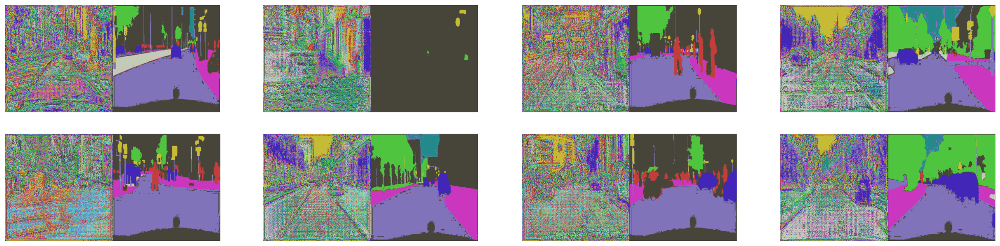

  0%|          | 0/372 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

[Epoch:0] Train:[loss:0.9120 iou:0.5952]Val:[loss:0.7462 iou:0.6531]


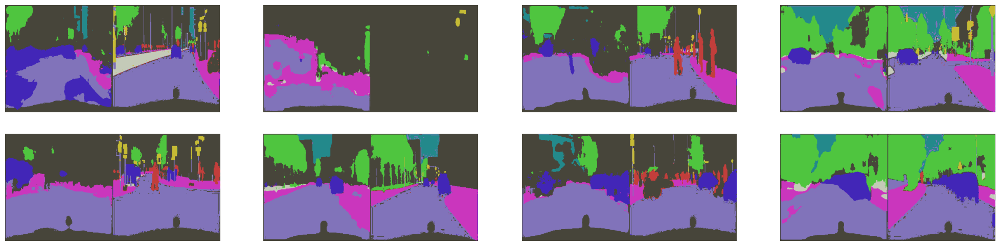

  0%|          | 0/372 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

[Epoch:1] Train:[loss:0.6532 iou:0.6760]Val:[loss:0.6156 iou:0.6864]


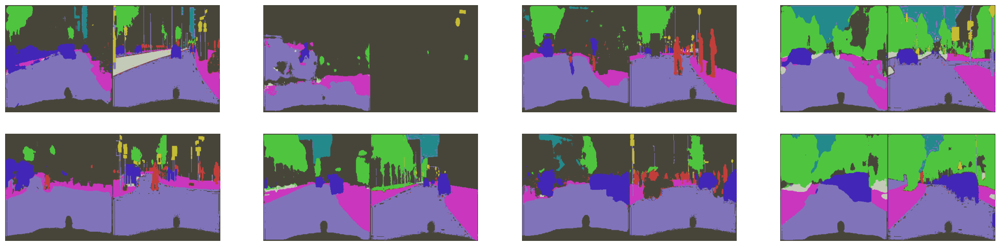

  0%|          | 0/372 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

[Epoch:2] Train:[loss:0.5637 iou:0.7089]Val:[loss:0.5563 iou:0.7065]


In [19]:
model_with_skips = UNet(num_classes = 10, skips=True)
get_num_parameters(model_with_skips)

trainer = Trainer(
    model=model_with_skips,
    train_loader=train_loader,
    val_loader=val_loader,
    colors=colors,
    device=device
)

trainer.train(epochs=3)


Number of parameters: 31,397,386


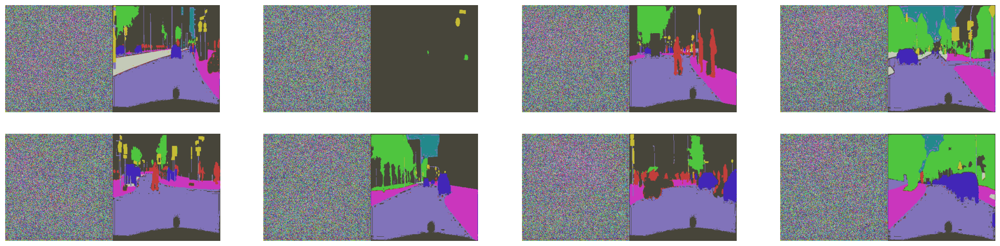

  0%|          | 0/372 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

[Epoch:0] Train:[loss:0.9458 iou:0.5779]Val:[loss:0.7418 iou:0.6403]


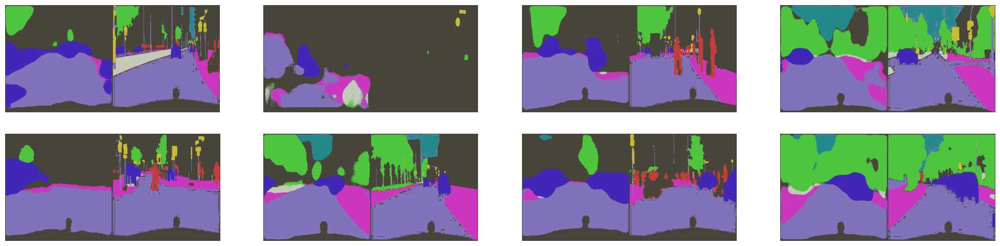

  0%|          | 0/372 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

[Epoch:1] Train:[loss:0.6734 iou:0.6690]Val:[loss:0.6331 iou:0.6777]


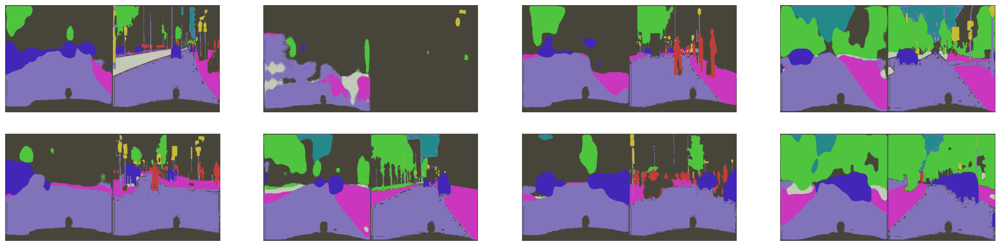

  0%|          | 0/372 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

[Epoch:2] Train:[loss:0.5870 iou:0.6998]Val:[loss:0.5878 iou:0.6971]


In [20]:
model_wo_skips = UNet(num_classes = 10, skips=False)
get_num_parameters(model_wo_skips)

trainer = Trainer(
    model=model_wo_skips,
    train_loader=train_loader,
    val_loader=val_loader,
    colors=colors,
    device=device
)

trainer.train(epochs=3)


In [22]:
torch.save(model_with_skips.state_dict(), './weights/model_with_skip.pth')
torch.save(model_wo_skips.state_dict(), './weights/model_wo_skip.pth')


#### Observations on IoU

<table>
    <tr>
        <th>Model</th>
        <th># Parameters</th>
        <th colspan="2">Epoch 1</th>
        <th colspan="2">Epoch 2</th>
        <th colspan="2">Epoch 3</th>
    </tr>
        <tr>
        <th></th>
        <th></th>
        <th colspan="1">Loss</th>
        <th colspan="1">IoU</th>
        <th colspan="1">Loss</th>
        <th colspan="1">IoU</th>
        <th colspan="1">Loss</th>
        <th colspan="1">IoU</th>
    </tr>
    <tr>
        <td>Unet with skips</td>
        <td>34.5M</td>
        <td>0.7462</td>
        <td>0.6531</td>
        <td>0.6156</td>
        <td>0.6864</td>
        <td>0.5563</td>
        <td>0.7065</td>
    </tr>
    </tr>
    </tr>
    <tr>
        <td>Unet w/o skips</td>
        <td>31.3M</td>
        <td>0.7418</td>
        <td>0.6403</td>
        <td>0.6331</td>
        <td>0.6777</td>
        <td>0.5878</td>
        <td>0.6971</td>
    </tr>
</table>

1. The IoU of UNet w/o skip connections is slightly less than that of UNet with skip connections.
2. One reason for similar performace of both the models is having a very small batch size. Because of a batch size of 8, the models go through a lot more gradient updates and hence optimizes equally well. 


### 3. Metric

The original implemented IoU directly uses ```logical_or```, ```logical_and``` on the model prediction which is infact incorrect because the model output probabilities for each class for each pixel. Hence, first we need to take the argmax over all the pixels and then for each label in ground truth extract the mask both in prediction and ground truth and find the IoU. Finally, the IoUs can be averaged for all the labels or a weighted average based on the frequence of each label, the later being implemented here. 



In [29]:
def report_iou(model, loader):
    ious = []
    for x, y in tqdm(loader):
        with torch.no_grad():
            x, y = x.to(device), y.to(device)
            y_pred = model(x)
            iou = trainer.calc_iou(y, torch.argmax(y_pred.detach(), dim=1))
            ious.append(iou.item())
    
    return ious

iou_with_skips = report_iou(model_with_skips, val_loader)
iou_wo_skips = report_iou(model_wo_skips, val_loader)


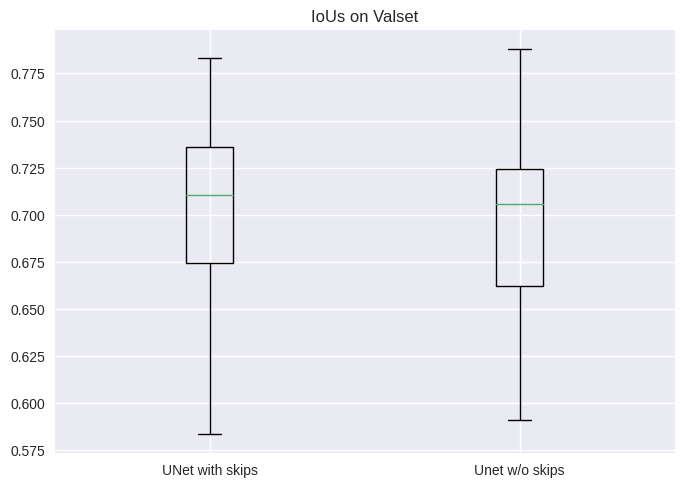

In [46]:
plt.boxplot([iou_with_skips, iou_wo_skips], positions=[1, 2])
plt.xticks([1, 2], ['UNet with skips', 'Unet w/o skips'])
plt.title('IoUs on Valset')
plt.show()

In [51]:
print(f"mIoU of UNet with skips: {np.mean(iou_with_skips):.5f}")
print(f"mIoU of UNet w/o skips: {np.mean(iou_wo_skips):.5f}")


mIoU of UNet with skips: 0.70649
mIoU of UNet w/o skips: 0.69707


## Q2: Contrastive Language-Image Pretraining

### 1. Setup Models

In [3]:
resnet50 = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V1).to(device).eval()
resnet_transform = torchvision.models.ResNet50_Weights.IMAGENET1K_V1.transforms()

get_num_parameters(resnet50)

/home2/md.faizal/miniforge3/envs/cong/lib/python3.9/site-packages/torch/hub.py:700: UserWarning: TORCH_MODEL_ZOO is deprecated, please use env TORCH_HOME instead
  warnings.warn('TORCH_MODEL_ZOO is deprecated, please use env TORCH_HOME instead')


Number of parameters: 25,557,032


In [4]:
import clip
# print(clip.available_models())
clip_resnet, preprocess = clip.load("RN50", device=device)
clip_resnet.eval()
clip_resnet.float()
# clip_resnet.half()

get_num_parameters(clip_resnet)

Number of parameters: 102,007,137


### 2. Setup data

##### Imagenet Dataset

<img src="https://cv.gluon.ai/_images/imagenet_banner.jpeg"></img>

The ImageNet dataset is a vast collection of labeled images, pivotal for advancing computer vision research. It contains millions of images across thousands of categories, supporting tasks like image classification and object detection. This dataset has helped progress in deep learning, particularly with convolutional neural networks. Pre-trained models on ImageNet, such as AlexNet, ResNet, VGG etc, serve as foundational tools for various applications. 


1. The label hierarchy used in ImageNet is based on WordNet, a large lexical database of English. ImageNet organizes its labels into a hierarchical structure that follows WordNet's synsets (sets of synonyms).

2.  A synset, short for "synonym set," is a group of words or terms that are synonymous or semantically related. In the context of ImageNet and WordNet, a synset represents a set of words or phrases that describe the same concept or object.

3. Yes, grouping images based on synsets can lead to problems because synsets group words based on semantical concepts whereas for tasks like visual recognition, we want grouping based on visual features. That is, these semantical similarities might be irrelevant for vision based models. Also, images in the same synset can still have different visual features.

4.  (i) Difference in color, size, shape. \
    (ii) Difference in the background setting of the object. Even though the object is present in the image, but the background can still vary which leads to contextual differences. \
    (iii) 

Dataset download: wget https://image-net.org/data/tiny-imagenet-200.zip

### 3. Zero-shot CLIP

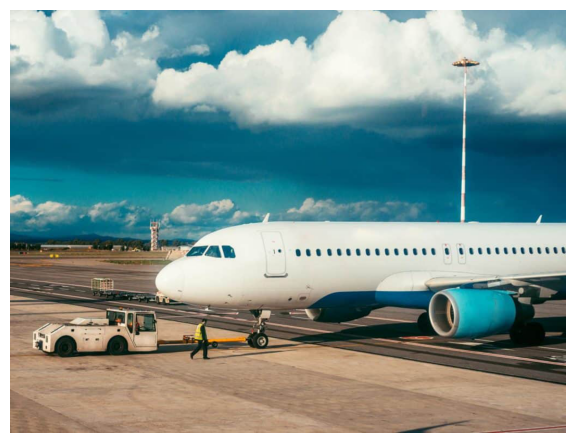

In [6]:
IMG_URL = 'https://www.connollycove.com/wp-content/uploads/2022/09/Air-Statistics-2-1024x781.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

In [5]:
from PIL import Image

def get_clip_pred(img, text, topk=5, fp=32):
    img_clip = preprocess(Image.fromarray(img)).unsqueeze(0).to(device)
    text_clip = clip.tokenize(text).to(device)
    
    if fp == 16:
        img_clip = img_clip.half()
        print(img_clip.dtype, text_clip.dtype)
        # text_clip.half()
        
    time_taken = time.time()
    
    with torch.no_grad():
        logits, _ = clip_resnet(img_clip, text_clip)
        probs = logits.softmax(dim=-1).cpu()
    time_taken = time.time() - time_taken
    probs = torch.topk(probs[0], k=topk, largest=True, sorted=True)
    
    return {
        'probs': probs.values.numpy(), 
        'label': text[probs.indices.numpy()],
        'time_taken': time_taken
    }
    
def get_resnet_pred(img, topk=5):
    img_resnet = resnet_transform(torch.from_numpy(img).permute(2, 0, 1)).to(device)
    time_taken = time.time()
    
    with torch.no_grad():
        pred = resnet50(img_resnet.unsqueeze(0))
        pred = torch.nn.functional.softmax(pred, dim=-1).cpu()
    time_taken = time.time() - time_taken 
    pred = torch.topk(pred[0], k=topk, largest=True, sorted=True)
    # print(np.array(list(imagenet.values()))[pred.indices.numpy()])
    # print(imagenet[pred_label], ":", torch.max(pred), pred_label)
    return {
        'probs': pred.values.numpy(),
        'label': np.array(list(imagenet.values()))[pred.indices.numpy()],
        'time_taken': time_taken
    }    


In [8]:
get_clip_pred(img, np.array(["car", "road", "car pushback"]), topk=3)

{'probs': array([0.94074804, 0.04518799, 0.01406401], dtype=float32),
 'label': array(['car pushback', 'car', 'road'], dtype='<U12'),
 'time_taken': 0.2837660312652588}

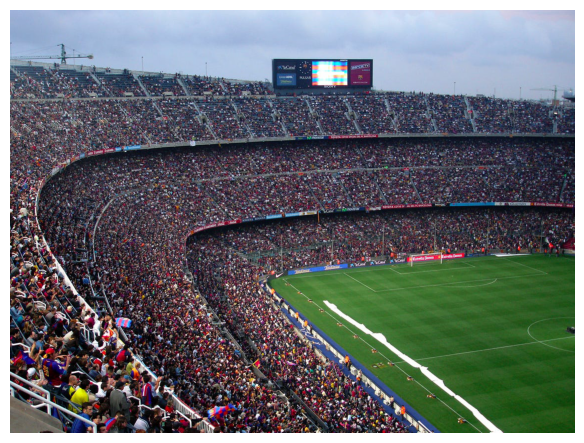

{'probs': array([9.2145818e-01, 7.8245774e-02, 1.4998221e-04, 1.4610199e-04],
       dtype=float32),
 'label': array(['football stadium', 'a huge crowd', 'buildings', 'grass'],
       dtype='<U16'),
 'time_taken': 0.024295806884765625}

In [9]:
IMG_URL = 'https://i.insider.com/572d8464dd08956c3e8b4574?width=1136&format=jpeg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

get_clip_pred(img, np.array(["a huge crowd", "buildings", "football stadium", "grass"]), topk=4)

### 4. CLIP vs ImageNet pretraining

##### GoldFish

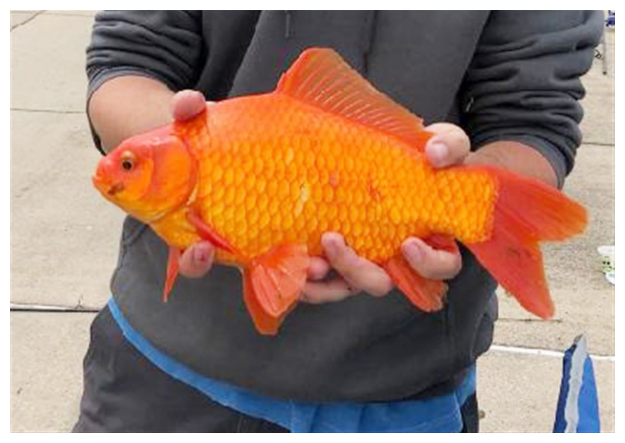

CLIP: {'probs': array([0.96574146, 0.01398975, 0.00897995, 0.00189158, 0.00117605],
      dtype=float32), 'label': array(['goldfish, Carassius auratus', 'tench, Tinca tinca', 'orange',
       'armadillo', 'cock'], dtype='<U122'), 'time_taken': 0.7384376525878906}
ResNet: {'probs': array([0.6164377 , 0.34429395, 0.0092182 , 0.00787402, 0.00332838],
      dtype=float32), 'label': array(['tench, Tinca tinca', 'goldfish, Carassius auratus',
       'barracouta, snoek',
       'American lobster, Northern lobster, Maine lobster, Homarus americanus',
       'rock beauty, Holocanthus tricolor'], dtype='<U122'), 'time_taken': 0.010411262512207031}


In [36]:
IMG_URL = 'https://9b16f79ca967fd0708d1-2713572fef44aa49ec323e813b06d2d9.ssl.cf2.rackcdn.com/1140x_a10-7_cTC/goldfish-lake-erie-conservation-disposal-1627786853.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

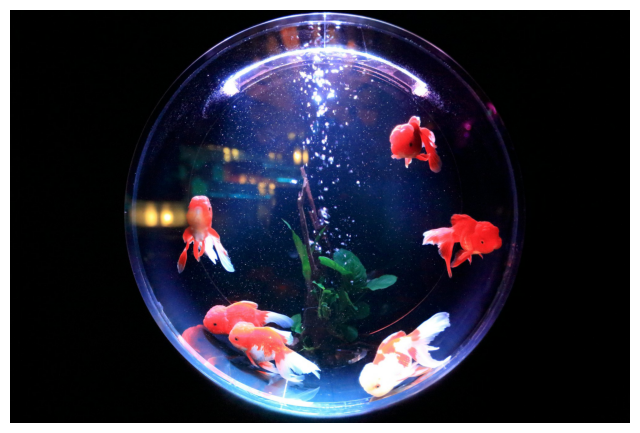

CLIP: {'probs': array([0.40915996, 0.13369238, 0.0754306 , 0.0741782 , 0.04196608],
      dtype=float32), 'label': array(['goldfish, Carassius auratus', 'jellyfish', 'Petri dish',
       'coral reef', 'electric ray, crampfish, numbfish, torpedo'],
      dtype='<U122'), 'time_taken': 0.7447938919067383}
ResNet: {'probs': array([5.6792700e-01, 4.2814222e-01, 2.2707169e-03, 3.4611931e-04,
       1.8073725e-04], dtype=float32), 'label': array(['bubble', 'Petri dish', 'goldfish, Carassius auratus', 'jellyfish',
       'ladle'], dtype='<U122'), 'time_taken': 0.009938716888427734}


In [39]:
IMG_URL = 'https://images.unsplash.com/photo-1436891461396-6df41158de09?crop=entropy&cs=tinysrgb&fit=max&fm=jpg&ixid=M3wxMTc3M3wwfDF8c2VhcmNofDJ8fGZpc2glMjBib3dsfGVufDB8fHx8MTY4NTAyMzU0Mnww&ixlib=rb-4.0.3&q=80&w=2000'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

Works well with ImageNet pretraining but not CLIP

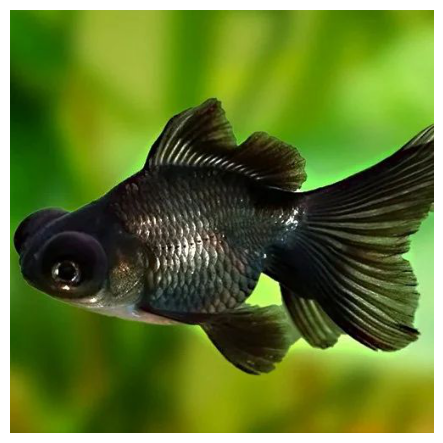

{'probs': array([0.42179134, 0.37462842, 0.01314442, 0.0106267 , 0.01037218],
      dtype=float32), 'label': array(['tench, Tinca tinca', 'goldfish, Carassius auratus',
       'Brabancon griffon', 'bulbul',
       'puffer, pufferfish, blowfish, globefish'], dtype='<U122'), 'time_taken': 0.7438464164733887}
{'probs': array([0.35711443, 0.22762115, 0.07394006, 0.0518502 , 0.03482009],
      dtype=float32), 'label': array(['goldfish, Carassius auratus', 'tench, Tinca tinca', 'hummingbird',
       'gar, garfish, garpike, billfish, Lepisosteus osseus',
       'barracouta, snoek'], dtype='<U122'), 'time_taken': 0.010035514831542969}


In [24]:
IMG_URL = 'https://5.imimg.com/data5/SELLER/Default/2024/3/398362504/BB/KX/IQ/38095066/black-moose-500x500.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))


#### Mosque

ImageNet Fails

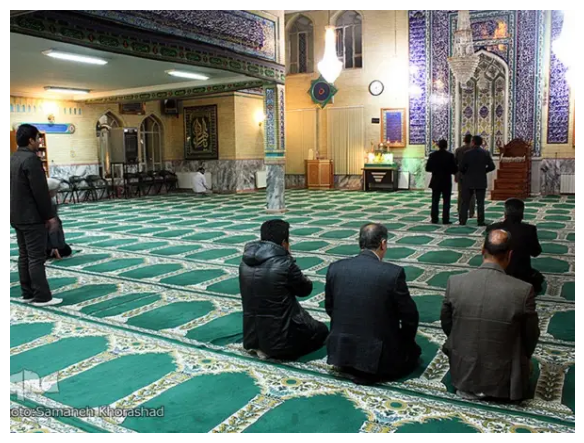

CLIP: {'probs': array([0.5404458 , 0.21842441, 0.04670703, 0.02570223, 0.01564591],
      dtype=float32), 'label': array(['mosque', 'prayer rug, prayer mat', 'yurt', 'throne',
       'suit, suit of clothes'], dtype='<U122'), 'time_taken': 0.7649240493774414}
ResNet: {'probs': array([0.91858447, 0.04038454, 0.00719708, 0.00617078, 0.00545201],
      dtype=float32), 'label': array(['prayer rug, prayer mat', 'mosque', 'palace', 'maze, labyrinth',
       'church, church building'], dtype='<U122'), 'time_taken': 0.010255813598632812}


In [41]:
IMG_URL = 'https://i.iranintl.com/images/rdk9umy0/production/ae5ecec939bb75a6f5197cb887e5e70ad15a893c-750x500.jpg?rect=42,0,667,500&w=600&h=450&fm=webp&q=70'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))


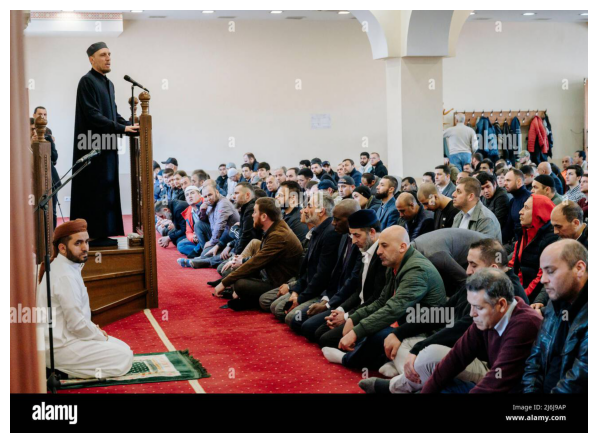

CLIP: {'probs': array([0.74261844, 0.09404811, 0.01470541, 0.00703648, 0.00701846],
      dtype=float32), 'label': array(['mosque', 'abaya', 'prayer rug, prayer mat', 'throne',
       'pajama, pyjama, pj\'s, jammies"'], dtype='<U122'), 'time_taken': 0.7356255054473877}
ResNet: {'probs': array([0.17131616, 0.15136558, 0.06101243, 0.04328918, 0.03700194],
      dtype=float32), 'label': array(['television, television system', 'stage',
       'pool table, billiard table, snooker table',
       'laptop, laptop computer', 'home theater, home theatre'],
      dtype='<U122'), 'time_taken': 0.009689569473266602}


In [43]:
IMG_URL = 'https://c8.alamy.com/comp/2J6J9AP/kyiv-ukraine-may-2-2022-kiev-kyiv-kiev-kyiv-ukraine-an-imam-seen-while-gving-a-sermon-on-the-morning-of-april-2nd-muslim-people-gathered-at-the-islamic-cultural-center-in-kyiv-to-celebrate-eid-al-fitr-the-festival-of-breaking-the-fast-also-known-as-ramazan-bayrami-holiday-following-the-end-of-ramadan-holy-month-credit-image-valeria-ferrarozuma-press-wire-credit-zuma-press-incalamy-live-news-2J6J9AP.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))


CLIP fails

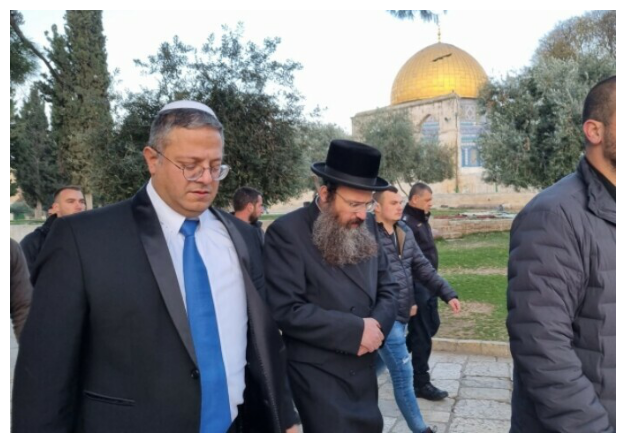

CLIP: {'probs': array([0.4345658 , 0.09121608, 0.0737462 , 0.02537115, 0.02249134],
      dtype=float32), 'label': array(['suit, suit of clothes', 'Windsor tie', 'bulletproof vest',
       'academic gown, academic robe, judge\'s robe"', 'military uniform'],
      dtype='<U122'), 'time_taken': 0.009781599044799805}
ResNet: {'probs': array([0.18012168, 0.08180773, 0.07432804, 0.06372019, 0.02483846],
      dtype=float32), 'label': array(['mosque', 'alp', 'yurt', 'ant, emmet, pismire', 'bagel, beigel'],
      dtype='<U122'), 'time_taken': 0.737316370010376}


In [50]:
IMG_URL = 'https://i.dawn.com/primary/2023/01/03174250b815e9c.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

#### Duck

ResNet Fails

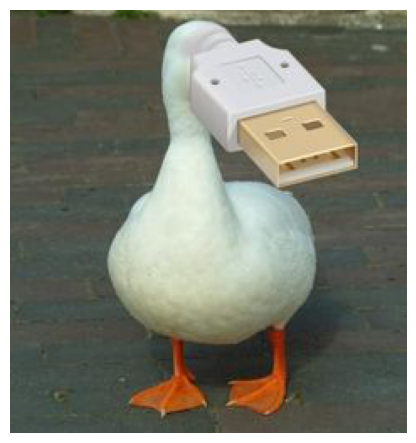

CLIP: {'probs': array([0.8558034 , 0.12718162, 0.00574366, 0.00237808, 0.00225789],
      dtype=float32), 'label': array(['goose', 'drake', 'albatross, mollymawk',
       'red-breasted merganser, Mergus serrator',
       'black swan, Cygnus atratus'], dtype='<U122'), 'time_taken': 0.011109352111816406}
ResNet: {'probs': array([0.18720727, 0.08039745, 0.0719873 , 0.06647561, 0.06273864],
      dtype=float32), 'label': array(['birdhouse', 'hand-held computer, hand-held microcomputer',
       'switch, electric switch, electrical switch', 'modem', 'iPod'],
      dtype='<U122'), 'time_taken': 0.7401361465454102}


In [53]:
IMG_URL = 'https://i.pinimg.com/236x/3e/17/1a/3e171aae4436f38ad9b02f98ff37cb98.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

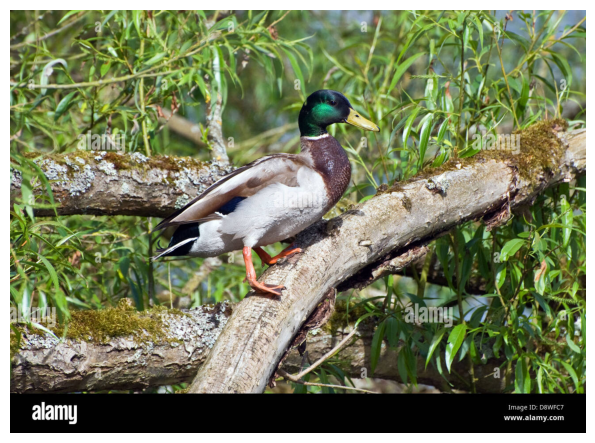

CLIP: {'probs': array([0.8535304 , 0.06157757, 0.04119505, 0.00940729, 0.00644138],
      dtype=float32), 'label': array(['red-breasted merganser, Mergus serrator',
       'European gallinule, Porphyrio porphyrio', 'jacamar',
       'black stork, Ciconia nigra', 'albatross, mollymawk'],
      dtype='<U122'), 'time_taken': 0.753201961517334}
ResNet: {'probs': array([9.9140996e-01, 3.9883372e-03, 1.0712078e-03, 9.3139359e-04,
       3.6755597e-04], dtype=float32), 'label': array(['drake', 'red-breasted merganser, Mergus serrator', 'peacock',
       'black stork, Ciconia nigra', 'hummingbird'], dtype='<U122'), 'time_taken': 0.010131597518920898}


In [62]:
IMG_URL = 'https://c8.alamy.com/comp/D8WFC7/mallard-duck-in-a-tree-D8WFC7.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_resnet_pred(img, topk=5))
print("ResNet:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))

CLIP fails

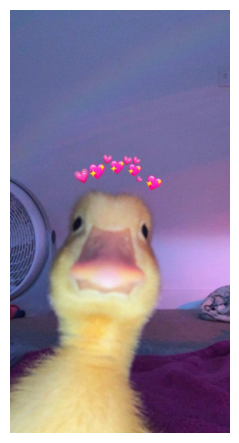

CLIP: {'probs': array([0.3434728 , 0.02566298, 0.02337217, 0.02117557, 0.01768371],
      dtype=float32), 'label': array(['puffer, pufferfish, blowfish, globefish', 'microphone, mike',
       'African grey, African gray, Psittacus erithacus', 'waffle iron',
       'mask'], dtype='<U122'), 'time_taken': 0.010596036911010742}
ResNet: {'probs': array([0.17394474, 0.06891701, 0.06706013, 0.04247546, 0.03790311],
      dtype=float32), 'label': array(['goose', 'cock', 'jay', 'drumstick', 'albatross, mollymawk'],
      dtype='<U122'), 'time_taken': 0.7560856342315674}


In [59]:
IMG_URL = 'https://i.pinimg.com/736x/0d/9a/eb/0d9aeb05b0f247127acd08d0c862ca8e.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_resnet_pred(img, topk=5))
print("ResNet:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))

#### Hen

ResNet Fails

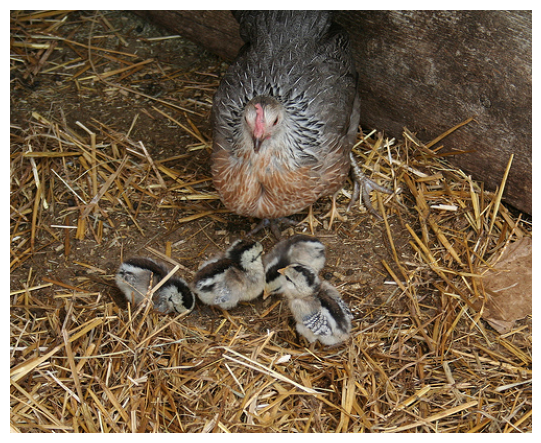

CLIP: {'probs': array([0.60846496, 0.10162245, 0.07024094, 0.03440958, 0.01864781],
      dtype=float32), 'label': array(['hen', 'African grey, African gray, Psittacus erithacus', 'quail',
       'American coot, marsh hen, mud hen, water hen, Fulica americana',
       'guinea pig, Cavia cobaya'], dtype='<U122'), 'time_taken': 0.7523531913757324}
ResNet: {'probs': array([0.60664356, 0.19375888, 0.04330013, 0.03661346, 0.02178447],
      dtype=float32), 'label': array(['hog, pig, grunter, squealer, Sus scrofa', 'hay', 'ram, tup',
       'wild boar, boar, Sus scrofa', 'corn'], dtype='<U122'), 'time_taken': 0.009424924850463867}


In [16]:
IMG_URL = 'https://i.postimg.cc/yNLhjjN6/hen1.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

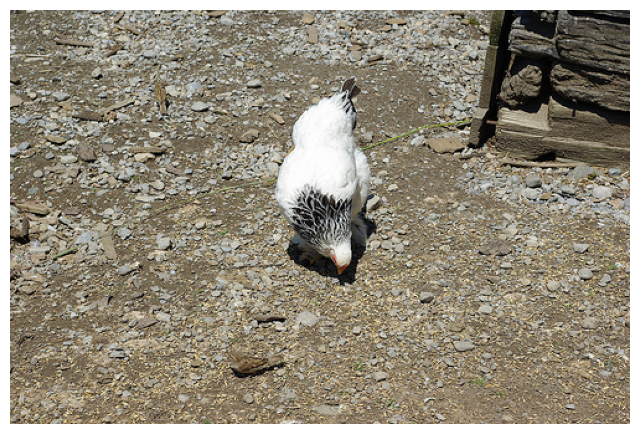

CLIP: {'probs': array([0.8288818 , 0.04532722, 0.02716765, 0.01187221, 0.01119936],
      dtype=float32), 'label': array(['hen', 'quail', 'cock',
       'ruffed grouse, partridge, Bonasa umbellus', 'vulture'],
      dtype='<U122'), 'time_taken': 0.008708000183105469}
ResNet: {'probs': array([0.562656  , 0.03862347, 0.03703376, 0.03490898, 0.03355704],
      dtype=float32), 'label': array(['sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita',
       'vulture', 'ptarmigan', 'white stork, Ciconia ciconia', 'hen'],
      dtype='<U122'), 'time_taken': 0.7515935897827148}


In [17]:
IMG_URL = 'https://i.postimg.cc/654vJzb1/hen3.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

Clip Fails

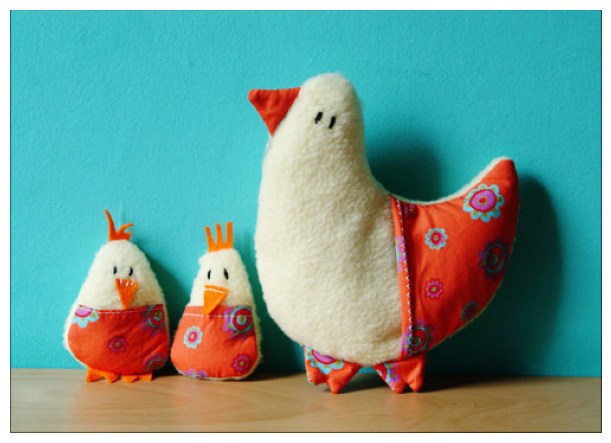

CLIP: {'probs': array([0.26348394, 0.12427597, 0.11286917, 0.10082515, 0.05315261],
      dtype=float32), 'label': array(['bib', 'Christmas stocking', 'purse', 'pencil box, pencil case',
       'pillow'], dtype='<U122'), 'time_taken': 0.011513948440551758}
ResNet: {'probs': array([0.08294991, 0.07116536, 0.03868094, 0.032594  , 0.03181692],
      dtype=float32), 'label': array(['hen', 'wood rabbit, cottontail, cottontail rabbit',
       'albatross, mollymawk', 'llama', 'butternut squash'], dtype='<U122'), 'time_taken': 0.7646229267120361}


In [13]:
IMG_URL = 'https://i.postimg.cc/y6MmLk7R/hen2.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

#### Cats

ResNet Fails

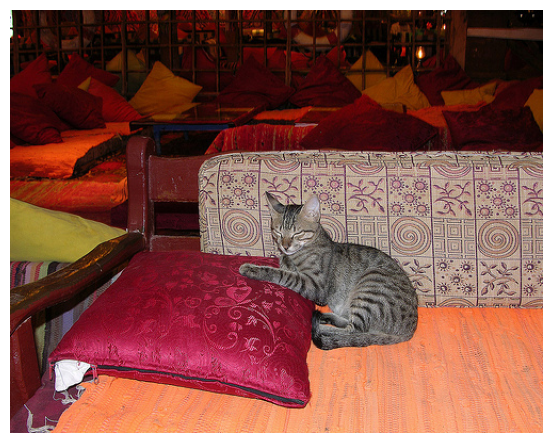

CLIP: {'probs': array([0.2508441 , 0.19057715, 0.10269772, 0.0952789 , 0.06456541],
      dtype=float32), 'label': array(['paddlewheel, paddle wheel', 'organ, pipe organ', 'Egyptian cat',
       'electric fan, blower', 'quilt, comforter, comfort, puff'],
      dtype='<U122'), 'time_taken': 0.760878324508667}
ResNet: {'probs': array([0.6460392 , 0.07024787, 0.06318508, 0.0585862 , 0.03145888],
      dtype=float32), 'label': array(['quilt, comforter, comfort, puff', 'studio couch, day bed',
       'prayer rug, prayer mat', 'four-poster', 'pillow'], dtype='<U122'), 'time_taken': 0.008804559707641602}


In [19]:
IMG_URL = 'https://i.postimg.cc/3JhBKdzT/egyptian-mau1.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

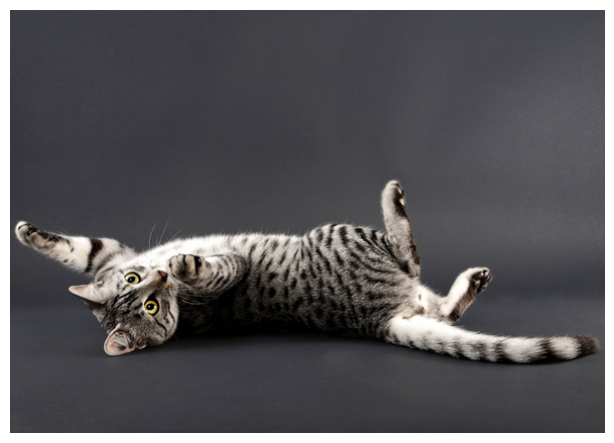

CLIP: {'probs': array([0.77590036, 0.10732435, 0.10418962, 0.00195703, 0.00157739],
      dtype=float32), 'label': array(['Egyptian cat', 'tabby, tabby cat', 'tiger cat',
       'tiger, Panthera tigris', 'snow leopard, ounce, Panthera uncia'],
      dtype='<U122'), 'time_taken': 0.009064674377441406}


ResNet: {'probs': array([0.29590347, 0.10810488, 0.08994232, 0.04141466, 0.02808426],
      dtype=float32), 'label': array(['tabby, tabby cat', 'tiger cat',
       'Madagascar cat, ring-tailed lemur, Lemur catta', 'Egyptian cat',
       'lynx, catamount'], dtype='<U122'), 'time_taken': 0.765599250793457}


In [22]:
IMG_URL = 'https://cdn-images.vetstreet.com/e7/3e/c75aa35944c3bb93411cbb775dae/egyptian-mau-ap-0bp847-590.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

CLIP fails

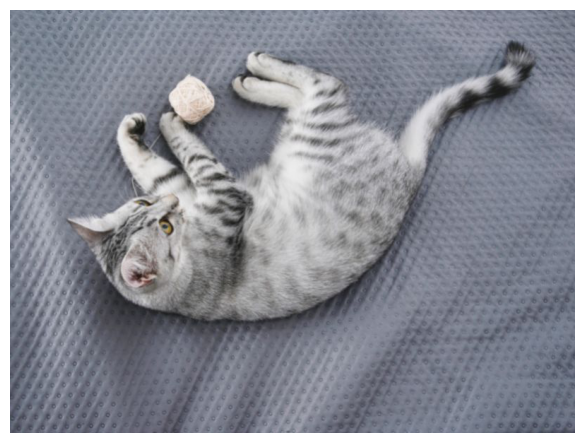

CLIP: {'probs': array([0.08459998, 0.08147718, 0.03832798, 0.03300268, 0.0329072 ],
      dtype=float32), 'label': array(['pretzel', 'tabby, tabby cat', 'sleeping bag', 'French loaf',
       'pillow'], dtype='<U122'), 'time_taken': 0.7781939506530762}
ResNet: {'probs': array([9.9599302e-01, 2.1286455e-03, 1.1668699e-03, 5.1626738e-04,
       6.4276217e-05], dtype=float32), 'label': array(['Egyptian cat', 'tabby, tabby cat', 'tiger cat',
       'snow leopard, ounce, Panthera uncia', 'lynx, catamount'],
      dtype='<U122'), 'time_taken': 0.009056568145751953}


In [23]:
IMG_URL = 'https://images.canvaspersonalized.com/wp-content/uploads/2023/02/05084722/egyptian-mau-cat-breed-3.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

#### Airplane

ResNet fails

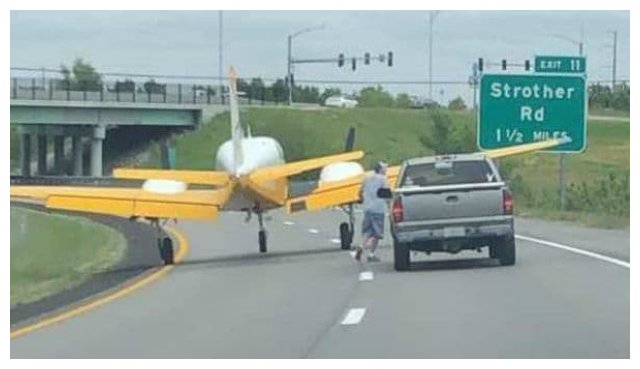

CLIP: {'probs': array([0.16654742, 0.08840747, 0.05757328, 0.03885133, 0.03262275],
      dtype=float32), 'label': array(['tow truck, tow car, wrecker', 'motor scooter, scooter',
       'plane, carpenter\'s plane, woodworking plane"',
       'seat belt, seatbelt', 'slot, one-armed bandit'], dtype='<U122'), 'time_taken': 0.7526907920837402}
ResNet: {'probs': array([0.278154  , 0.11902882, 0.04767634, 0.04447088, 0.04091915],
      dtype=float32), 'label': array(['stretcher', 'amphibian, amphibious vehicle',
       'trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi',
       'tow truck, tow car, wrecker', 'snowplow, snowplough'],
      dtype='<U122'), 'time_taken': 0.009567975997924805}


In [29]:
IMG_URL = 'https://images.hindustantimes.com/auto/img/2020/05/23/600x338/99010857_10102899682859671_6808644635955560448_n_1590212759059_1590212775921.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

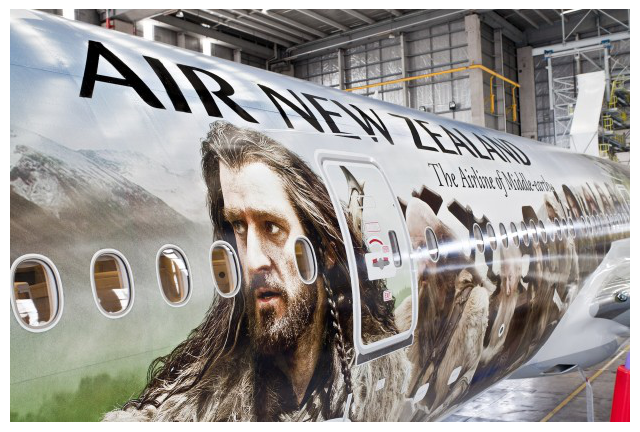

CLIP: {'probs': array([0.5690589 , 0.04165284, 0.0299523 , 0.020446  , 0.01067807],
      dtype=float32), 'label': array(['airliner', 'plane, carpenter\'s plane, woodworking plane"',
       'oxygen mask', 'mailbag, postbag', 'bullet train, bullet'],
      dtype='<U122'), 'time_taken': 0.7628786563873291}
ResNet: {'probs': array([0.23817436, 0.11401735, 0.06228842, 0.06134095, 0.03538831],
      dtype=float32), 'label': array(['barbershop', 'chain saw, chainsaw', 'comic book', 'syringe',
       'space shuttle'], dtype='<U122'), 'time_taken': 0.008868932723999023}


In [31]:
IMG_URL = 'https://www.travelstart.co.za/blog/wp-content/uploads/2014/10/Air-New-Zealand-Middle-Earth.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

CLIP fails

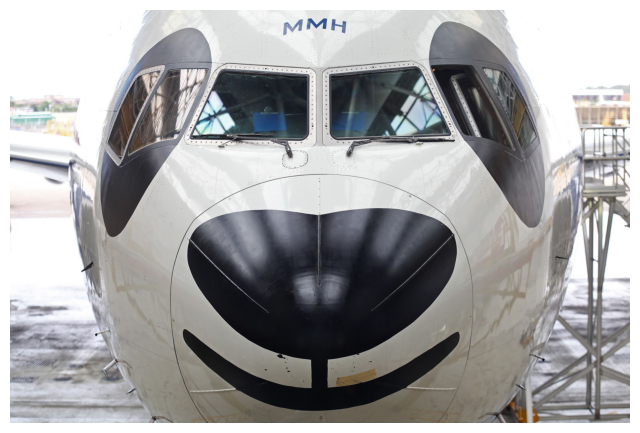

CLIP: {'probs': array([0.5198971 , 0.14559829, 0.07362676, 0.0712137 , 0.04305831],
      dtype=float32), 'label': array(['warplane, military plane', 'soccer ball', 'water tower',
       'missile', 'projectile, missile'], dtype='<U122'), 'time_taken': 0.00978541374206543}
ResNet: {'probs': array([0.19598925, 0.12330816, 0.04425901, 0.03972069, 0.03560187],
      dtype=float32), 'label': array(['airliner', 'bullet train, bullet', 'electric locomotive',
       'warplane, military plane', 'space shuttle'], dtype='<U122'), 'time_taken': 0.7607443332672119}


In [33]:
IMG_URL = 'https://media.cnn.com/api/v1/images/stellar/prod/130923175719-crazy-liveries-ba-panda.jpg?q=w_3089,h_2059,x_0,y_0,c_fill'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5))
print("ResNet:", get_resnet_pred(img, topk=5))

### 5. Converting CLIP image encoder to FP16


In [24]:
def clip_image_encoder_inference(PATH, fp='half'):
    files = [os.path.join(PATH, f) for f in os.listdir(PATH)]

    time_list = []

    for img in tqdm(files):
        img = plt.imread(img)
        img = cv2.resize(img, (224, 224))
        img_clip = preprocess(Image.fromarray(img)).unsqueeze(0).to(device)
        if fp == 'half':
            img_clip.half()
        else:
            img_clip.float()
            
        time_taken = time.time()
        with torch.no_grad():
            clip_resnet.encode_image(img_clip)
            
        time_taken = time.time() - time_taken 
        time_list.append(time_taken)
        
    print(f"Time taken: {np.mean(time_list):.5f} ({np.std(time_list)})")
    

PATH = '/scratch/fk/tiny-imagenet-200/train/n01443537/images'

print("With FP32")    
clip_image_encoder_inference(PATH, fp='double')
print("=" * 100)

clip_resnet.half()
print("With FP16")    
clip_image_encoder_inference(PATH, fp='half')


With FP32


  0%|          | 0/500 [00:00<?, ?it/s]

Time taken: 0.01421 (0.002399904570614953)
With FP16


  0%|          | 0/500 [00:00<?, ?it/s]

Time taken: 0.01432 (0.002343377003097235)


#### Recalculating the probabilities for fp16

In [59]:
clip_resnet.half()
print()

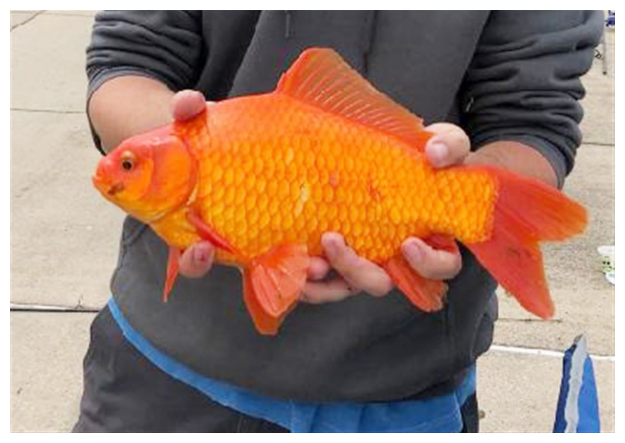

CLIP: {'probs': array([9.8032117e-01, 9.9004628e-03, 1.9841490e-03, 1.0763236e-03,
       5.3085492e-04], dtype=float32), 'label': array(['goldfish, Carassius auratus', 'tench, Tinca tinca', 'orange',
       'puffer, pufferfish, blowfish, globefish', 'armadillo'],
      dtype='<U122'), 'time_taken': 0.7432899475097656}


In [8]:
IMG_URL = 'https://9b16f79ca967fd0708d1-2713572fef44aa49ec323e813b06d2d9.ssl.cf2.rackcdn.com/1140x_a10-7_cTC/goldfish-lake-erie-conservation-disposal-1627786853.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()
noise = np.random.normal(0, 20, img.shape)
img = np.clip(img + noise, 0, 255).astype(np.uint8)

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5, fp=32))

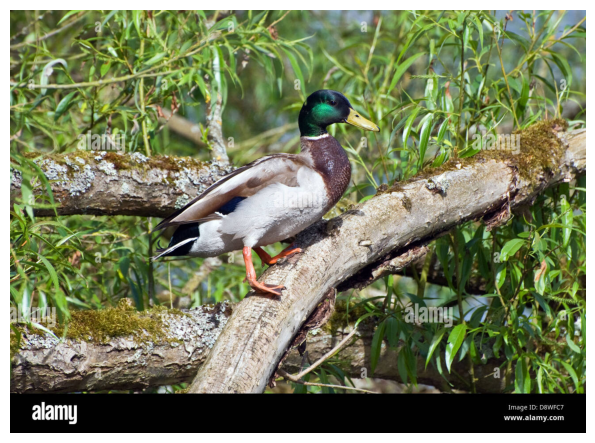

CLIP: {'probs': array([0.51969033, 0.30843303, 0.0655548 , 0.06223958, 0.00765567],
      dtype=float32), 'label': array(['red-breasted merganser, Mergus serrator',
       'European gallinule, Porphyrio porphyrio',
       'black stork, Ciconia nigra', 'jacamar', 'albatross, mollymawk'],
      dtype='<U122'), 'time_taken': 0.7205460071563721}


In [10]:
IMG_URL = 'https://c8.alamy.com/comp/D8WFC7/mallard-duck-in-a-tree-D8WFC7.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()
noise = np.random.normal(0, 30, img.shape)
img = np.clip(img + noise, 0, 255).astype(np.uint8)

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5, fp=32))

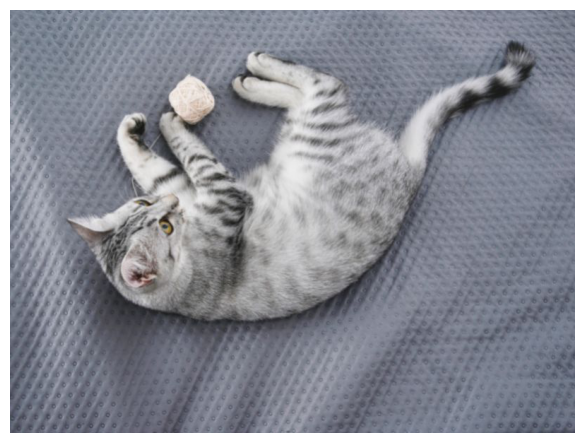

CLIP: {'probs': array([0.137896  , 0.05320686, 0.0390251 , 0.03219241, 0.031962  ],
      dtype=float32), 'label': array(['tabby, tabby cat', 'pretzel', 'sleeping bag', 'pillow',
       'hook, claw'], dtype='<U122'), 'time_taken': 0.6936140060424805}


In [11]:
IMG_URL = 'https://images.canvaspersonalized.com/wp-content/uploads/2023/02/05084722/egyptian-mau-cat-breed-3.jpg'

img = get_image(IMG_URL, img_size=None)
img = np.array(img)
plt.imshow(img)
plt.axis('off')
plt.show()
noise = np.random.normal(0, 10, img.shape)
img = np.clip(img + noise, 0, 255).astype(np.uint8)

print("CLIP:", get_clip_pred(img, np.array(list(imagenet.values())), topk=5, fp=32))

#### GPU Profiling